### Group Assignment |  (U1146817,u1152569,U1160853) |

### Customer Sentiment Insights: NLP Analysis of Amazon Reviews

In [1]:
import pandas as pd
# Reading CSV file
df = pd.read_csv('Amazon_Reviews_Dataset.csv')

In [2]:
df

,product name,ratings,reviews,date
0,Nautica Voyage By Nautica For Men. Eau De Toil...,4,\n\n This product exceeded my expectations! I...,"July 13, 2018"
1,Nautica Voyage By Nautica For Men. Eau De Toil...,5,\n\n This is a terrible knock off. When I ju...,"June 27, 2018"
2,Nautica Voyage By Nautica For Men. Eau De Toil...,1,"\n\n That's right, it smells kind of like a b...","October 5, 2017"
3,Nautica Voyage By Nautica For Men. Eau De Toil...,5,\n\n I was told by a friend this Cologne sme...,"November 24, 2015"
4,Nautica Voyage By Nautica For Men. Eau De Toil...,1,\n\n So originally i felt sketchy on ordering...,"July 19, 2018"
...,...,...,...,...
34995,Becoming,5,\n\n My wife loved reading it.\n\n,26-Dec-18
34996,Becoming,5,\n\n I don’t normally read autobiographies bu...,6-Apr-19
34997,Becoming,4,"\n\n I purchase this book for my mother, she ...",4-Jan-20
34998,Becoming,5,\n\n So glad I purchased. What a wonderful hu...,27-Dec-18


### Clean the text for Product and Review

In [2]:
import re
from bs4 import BeautifulSoup

# Function to remove HTML tags
def remove_html_tags(text):
    return BeautifulSoup(text, "html.parser").get_text()


#  Function to clean the review text
def clean_review_text(text):
    # Removing HTML/XML tags
    text = remove_html_tags(text)
    # removing any irrelevant characters and \n\n
    clean_text = re.sub(r'[^\w\s]', '', text)
    # Lowercasing
    text = text.lower()
    # Strip leading and trailing whitespace
    text = text.strip()
    return text


# Use normalize_text function to normalize  the 'text' column
df['clean_product_review_text'] = df['reviews'].apply(clean_review_text)

print(df['clean_product_review_text'])

/var/folders/_8/v7g4ts2141d2rd20gb20s33r0000gn/T/ipykernel_2404/784026016.py:6: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  return BeautifulSoup(text, "html.parser").get_text()


0        this product exceeded my expectations! i have ...
1        this is a terrible knock off.  when i just ord...
2        that's right, it smells kind of like a bowl of...
3        i was told by a friend this cologne  smells ve...
4        so originally i felt sketchy on ordering this ...
                               ...                        
34995                            my wife loved reading it.
34996    i don’t normally read autobiographies but coul...
34997    i purchase this book for my mother, she just n...
34998          so glad i purchased. what a wonderful human
34999    my sister’s with voices book club read this bo...
Name: clean_product_review_text, Length: 35000, dtype: object


### Tokenization of Product and Review column

In [30]:
import nltk
from nltk.tokenize import word_tokenize


# Function to tokenize text using NLTK's word_tokenize
def tokenize_text(text):
    return word_tokenize(text)

# Apply tokenization to the 'normalized_text' column and store the result in 'tokenization_text'
df['tokenization_review_text'] = df['clean_product_review_text'].apply(tokenize_text)
# Print the DataFrame with tokenized text
#print(df['tokenization_text'].iloc[0])

print("Product Review tokenized",df['tokenization_review_text'])

Product Review tokenized 0        [this, product, exceeded, my, expectations, !,...
1        [this, is, a, terrible, knock, off, ., when, i...
2        [that, 's, right, ,, it, smells, kind, of, lik...
3        [i, was, told, by, a, friend, this, cologne, s...
4        [so, originally, i, felt, sketchy, on, orderin...
                               ...                        
34995                    [my, wife, loved, reading, it, .]
34996    [i, don, ’, t, normally, read, autobiographies...
34997    [i, purchase, this, book, for, my, mother, ,, ...
34998    [so, glad, i, purchased, ., what, a, wonderful...
34999    [my, sister, ’, s, with, voices, book, club, r...
Name: tokenization_review_text, Length: 35000, dtype: object


### Removal of Stopwords

In [31]:
from nltk.corpus import stopwords
nltk.download('stopwords')  # Download the stopwords corpus

# Function to remove stopwords from tokenized text
def remove_stopwords(texts):
    stop_words = set(stopwords.words('english'))  # Get English stopwords
    return [word for word in texts if word not in stop_words]


# Apply stopwords removal to the 'tokenization_text' column and store the result in 'removed_stopwords_text'
df['removed_stopwords_reviews'] = df['tokenization_review_text'].apply(remove_stopwords)
# Print the DataFrame with stopwords removed
#print(df['removed_stopwords_text'].iloc[0])

print("Removal of Review Stopwords:")
print(df['removed_stopwords_reviews'].values)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/sanilanair/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Removal of Review Stopwords:
[list(['product', 'exceeded', 'expectations', '!', 'complaints', 'cologne', '.', 'smells', 'fresh', ',', 'vibrant', ',', 'sporty', ',', 'summery', '.', 'cologne', 'everything', 'wanted', ',', '!', 'actually', 'went', 'using', 'versace', 'cologne', 'masterpiece', ',', 'go', 'back', '!', 'bought', '$', '17', ',', 'naturally', 'little', 'skeptical', '.', 'trying', ',', 'could', "n't", 'happier', '.', 'great', 'every', 'day', 'cologne', 'worn', 'casually', 'formally', ',', "'s", 'versatile', '!', 'happily', 'buy', '!'])
 list(['terrible', 'knock', '.', 'ordered', 'received', 'immediately', 'compared', 'bottle', 'got', 'dillard', "'s", 'right', 'away', 'noticed', 'different', 'thought', 'maybe', 'ukka', 'changed', 'style', 'little', 'bit', 'awhile', 'since', 'purchased', 'cologne', '.', 'sprayed', 'shirt', 'compare', 'smell', ',', 'version', 'bought', 'amazon', 'smelt', 'like', 'rubbing', 'alcohol', 'little', 'bit', 'cologne', 'scent', 'mixed', '..', 'say', "n't

### Lemmatization

In [32]:
from nltk.stem import WordNetLemmatizer


# Function to lemmatize words in text
def lemmatize_texts(texts):
    lemmatizer = WordNetLemmatizer()  # Initialize WordNetLemmatizer
    return [lemmatizer.lemmatize(word) for word in texts]


# Apply lemmatization to  'removed_stopwords_text' column and store  in 'lemmatized_text'
df['lemmatized_review'] = df['removed_stopwords_reviews'].apply(lemmatize_texts)

# Print the DataFrame with lemmatized text
#print("Lemmatized Text:", df['lemmatized_text'].iloc[0])

print("Lemmatized Text:", df['lemmatized_review'].values)

Lemmatized Text: [list(['product', 'exceeded', 'expectation', '!', 'complaint', 'cologne', '.', 'smell', 'fresh', ',', 'vibrant', ',', 'sporty', ',', 'summery', '.', 'cologne', 'everything', 'wanted', ',', '!', 'actually', 'went', 'using', 'versace', 'cologne', 'masterpiece', ',', 'go', 'back', '!', 'bought', '$', '17', ',', 'naturally', 'little', 'skeptical', '.', 'trying', ',', 'could', "n't", 'happier', '.', 'great', 'every', 'day', 'cologne', 'worn', 'casually', 'formally', ',', "'s", 'versatile', '!', 'happily', 'buy', '!'])
 list(['terrible', 'knock', '.', 'ordered', 'received', 'immediately', 'compared', 'bottle', 'got', 'dillard', "'s", 'right', 'away', 'noticed', 'different', 'thought', 'maybe', 'ukka', 'changed', 'style', 'little', 'bit', 'awhile', 'since', 'purchased', 'cologne', '.', 'sprayed', 'shirt', 'compare', 'smell', ',', 'version', 'bought', 'amazon', 'smelt', 'like', 'rubbing', 'alcohol', 'little', 'bit', 'cologne', 'scent', 'mixed', '..', 'say', "n't", 'waste', 'ti

### N gram Modelling to Analyse the most common or frequent words in the reviews

In [33]:
import nltk
from nltk.corpus import reuters
from nltk import bigrams, trigrams
from collections import Counter, defaultdict

In [34]:

# Flatten the list of tokenized words
preprocessed_words = [word for sublist in df['lemmatized_review'] for word in sublist]

# Count the frequency of each word (unigram)
unigram_counts = Counter(preprocessed_words)

# Calculate the total number of words
total_count = sum(unigram_counts.values())

# Calculate the probability of each word
unigram_probs = {word: count / total_count for word, count in unigram_counts.items()}

unigram_probs

{'product': 0.004710248931587473,
 'exceeded': 3.713599200271394e-05,
 'expectation': 0.00013750353795599486,
 '!': 0.016883828580260916,
 'complaint': 0.0002860475059668506,
 'cologne': 0.0010638959871047777,
 '.': 0.0915201467774992,
 'smell': 0.002387743918228553,
 'fresh': 0.0004255583948419111,
 ',': 0.04938785833723094,
 'vibrant': 4.014701838131237e-06,
 'sporty': 9.033079135795283e-06,
 'summery': 6.022052757196855e-06,
 'everything': 0.0008501131142242893,
 'wanted': 0.0008440910614670925,
 'actually': 0.0007577749719472709,
 'went': 0.000525925940795192,
 'using': 0.0012596127017136755,
 'versace': 1.10404300548609e-05,
 'masterpiece': 8.029403676262473e-06,
 'go': 0.0017433842732084894,
 'back': 0.00131481485198798,
 'bought': 0.002538295237158474,
 '$': 0.0011020356545670244,
 '17': 3.813966746224675e-05,
 'naturally': 2.6095561947853037e-05,
 'little': 0.0018728584074882218,
 'skeptical': 9.73565195746825e-05,
 'trying': 0.000573098687393234,
 'could': 0.002258269783948820

In [35]:
from nltk.util import bigrams

# Batch size for processing
batch_size = 1000

# Initialize counters and models
bigram_counts = Counter()
unigram_counts = Counter()
bigram_model = defaultdict(lambda: defaultdict(lambda: 0))

# Iterate over the DataFrame in batches
for index in range(0, len(df), batch_size):
    # Flatten the list of lemmatized words for the current batch
    preprocessed_words = [word for sublist in df['lemmatized_review'][index:index+batch_size] for word in sublist]
    
    # Update unigram and bigram counts for the current batch
    bigram_counts.update(bigrams(preprocessed_words))
    unigram_counts.update(preprocessed_words)

# Calculate the probability of each bigram
for (w1, w2), count in bigram_counts.items():
    bigram_model[w1][w2] = count / unigram_counts[w1]


        
# Print a subset of the bigram model
num_printed = 0
for w1 in bigram_model:
    for w2 in bigram_model[w1]:
        print(f'Bigram: {w1} {w2}, Probability: {bigram_model[w1][w2]}')
        num_printed += 1
        if num_printed >= 1000:  # Limit the number of printed bigrams
            break
    if num_printed >= 1000:
        break

# Print a message to indicate completion
print('Bigram model processing completed.')


Bigram: product exceeded, Probability: 0.0006392499467291711
Bigram: product ,, Probability: 0.07628382697634775
Bigram: product ., Probability: 0.207969316002557
Bigram: product received, Probability: 0.005113999573833369
Bigram: product ?, Probability: 0.0012784998934583422
Bigram: product year, Probability: 0.0025569997869166845
Bigram: product need, Probability: 0.001065416577881952
Bigram: product years.my, Probability: 0.00021308331557639036
Bigram: product difference, Probability: 0.0006392499467291711
Bigram: product available.value, Probability: 0.00021308331557639036
Bigram: product level, Probability: 0.00021308331557639036
Bigram: product nothing, Probability: 0.0006392499467291711
Bigram: product review, Probability: 0.0019177498401875134
Bigram: product seller, Probability: 0.002130833155763904
Bigram: product nautica, Probability: 0.0008523332623055614
Bigram: product ..., Probability: 0.004687832942680588
Bigram: product price, Probability: 0.008097165991902834
Bigram: 

In [13]:
#bigram_counts
bigram_model

defaultdict(<function __main__.<lambda>()>,
            {'product': defaultdict(<function __main__.<lambda>.<locals>.<lambda>()>,
                         {'exceeded': 0.0006392499467291711,
                          ',': 0.07628382697634775,
                          '.': 0.207969316002557,
                          'received': 0.005113999573833369,
                          '?': 0.0012784998934583422,
                          'year': 0.0025569997869166845,
                          'need': 0.001065416577881952,
                          'years.my': 0.00021308331557639036,
                          'difference': 0.0006392499467291711,
                          'available.value': 0.00021308331557639036,
                          'level': 0.00021308331557639036,
                          'nothing': 0.0006392499467291711,
                          'review': 0.0019177498401875134,
                          'seller': 0.002130833155763904,
                          'nautica': 0.00085233326

In [11]:
x = 2  # Display the top 2 most probable bigrams for each first word
batch_size = 100  # Process 100 first words at a time

# Process the data in batches
for i in range(0, len(bigram_model), batch_size):
    # Get a batch of first words
    batch = list(bigram_model.keys())[i:i+batch_size]
    for w1 in batch:
        # Get the top 'x' most probable bigrams for each first word
        top_bigrams = sorted(bigram_model[w1].items(), key=lambda item: item[1], reverse=True)[:x]
        # Print the top bigrams for the current first word
        print(f"Top {x} bigrams starting with '{w1}': {top_bigrams}")

Top 2 bigrams starting with 'product': [('.', 0.207969316002557), (',', 0.07628382697634775)]
Top 2 bigrams starting with 'exceeded': [('expectation', 0.7837837837837838), ('.', 0.08108108108108109)]
Top 2 bigrams starting with 'expectation': [('.', 0.36496350364963503), ('!', 0.058394160583941604)]
Top 2 bigrams starting with '!': [('!', 0.2189394840090358), ('love', 0.03751040304363334)]
Top 2 bigrams starting with 'complaint': [('.', 0.20701754385964913), (',', 0.04912280701754386)]
Top 2 bigrams starting with 'cologne': [('.', 0.20471698113207548), (',', 0.0830188679245283)]
Top 2 bigrams starting with '.': [('love', 0.025267313702911662), ('’', 0.024828645062236112)]
Top 2 bigrams starting with 'smell': [('good', 0.11811685582177385), ('great', 0.11811685582177385)]
Top 2 bigrams starting with 'fresh': [(',', 0.1320754716981132), ('scent', 0.11084905660377359)]
Top 2 bigrams starting with ',': [('’', 0.01713170890320483), ("'s", 0.016400105676021706)]
Top 2 bigrams starting with '

In [15]:

from nltk.util import trigrams

# Batch size for processing
batch_size = 1000

# Initialize counters and models
trigram_counts = Counter()
bigram_counts = Counter()
trigram_model = defaultdict(lambda: defaultdict(lambda: 0))

# Iterate over the DataFrame in batches
for index in range(0, len(df), batch_size):
    # Flatten the list of lemmatized words for the current batch
    preprocessed_words = [word for sublist in df['lemmatized_review'][index:index+batch_size] for word in sublist]
    
    # Update trigram and bigram counts for the current batch
    trigram_counts.update(trigrams(preprocessed_words))
    bigram_counts.update(bigrams(preprocessed_words))

# Calculate the probability of each trigram
for (w1, w2, w3), count in trigram_counts.items():
    if bigram_counts[(w1, w2)] > 0:
        trigram_model[(w1, w2)][w3] = count / bigram_counts[(w1, w2)]

In [7]:

from nltk.util import trigrams

# Batch size for processing
batch_size = 1000

# Initialize counters and models
trigram_counts = Counter()
bigram_counts = Counter()
trigram_model = defaultdict(lambda: defaultdict(lambda: 0))

# Iterate over the DataFrame in batches
for index in range(0, len(df), batch_size):
    # Flatten the list of lemmatized words for the current batch
    preprocessed_words = [word for sublist in df['lemmatized_text'][index:index+batch_size] for word in sublist]
    
    # Update trigram and bigram counts for the current batch
    trigram_counts.update(trigrams(preprocessed_words))
    bigram_counts.update(bigrams(preprocessed_words))

# Calculate the probability of each trigram
for (w1, w2, w3), count in trigram_counts.items():
    if bigram_counts[(w1, w2)] > 0:
        trigram_model[(w1, w2)][w3] = count / bigram_counts[(w1, w2)]


In [17]:
#trigram_counts
trigram_model

defaultdict(<function __main__.<lambda>()>,
            {('product',
              'exceeded'): defaultdict(<function __main__.<lambda>.<locals>.<lambda>()>,
                         {'expectation': 1.0}),
             ('exceeded',
              'expectation'): defaultdict(<function __main__.<lambda>.<locals>.<lambda>()>,
                         {'!': 0.20689655172413793,
                          ',': 0.034482758620689655,
                          'time': 0.034482758620689655,
                          'product': 0.034482758620689655,
                          '.': 0.4482758620689655,
                          'love': 0.034482758620689655,
                          'owning': 0.034482758620689655,
                          'form': 0.034482758620689655,
                          'ten': 0.034482758620689655,
                          'm.': 0.034482758620689655,
                          '-': 0.034482758620689655,
                          'every': 0.034482758620689655}),
             (

In [18]:
# Define 'x' as the number of top entries you want to display
x = 2  

# Iterate over the trigram model in batches
for w1_w2 in trigram_model:
    top_trigrams = sorted(trigram_model[w1_w2].items(), key=lambda item: item[1], reverse=True)[:x]
    print(f"Top {x} trigrams starting with '{w1_w2}': {top_trigrams}")


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [20]:
# Check if 'hard' exists in the bigram model and has subsequent words
if 'exceeded' in bigram_model and bigram_model['exceeded']:
    next_word = max(bigram_model['exceeded'], key=bigram_model['exceeded'].get)
    print(f"Next word after 'exceeded' is likely to be '{next_word}'")
else:
    print("No subsequent words found for 'exceeded' in the bigram model.")

Next word after 'exceeded' is likely to be 'expectation'


In [23]:
# Define the word pair
word_pair = ('product', 'expectation')

# Check if the word pair exists in the trigram model and has subsequent words
if word_pair in trigram_model and trigram_model[word_pair]:
    next_word = max(trigram_model[word_pair], key=trigram_model[word_pair].get)
    print(f"Next word after '{word_pair[0]} {word_pair[1]}' is likely to be '{next_word}'")
else:
    print(f"No subsequent words found for '{word_pair[0]} {word_pair[1]}' in the trigram model.")

No subsequent words found for 'product expectation' in the trigram model.


### Topic Modelling -LDA

In [36]:
!pip install gensim nltk

In [37]:
from gensim.corpora import Dictionary


# Add 'lemmatized_text' column from df to preprocessed_documents
preprocessed_documents = df['lemmatized_review'].tolist()

# Create a dictionary representation of the documents
dictionary = Dictionary(preprocessed_documents)

# Create a bag-of-words corpus
corpus = [dictionary.doc2bow(doc) for doc in preprocessed_documents]

In [38]:
from gensim.models import LdaModel

# Set training parameters
num_topics = 8
passes = 20
model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, passes=passes)

# Assign topics to documents
df['LDA_Topic'] = [max(model[doc], key=lambda x: x[1])[0] for doc in corpus]

# Print the topics
topics = model.print_topics(num_words=10)
for topic in topics:
    print(topic)

(0, '0.125*"." + 0.072*"," + 0.015*"’" + 0.013*"n\'t" + 0.012*"one" + 0.010*"like" + 0.009*"time" + 0.008*"\'s" + 0.008*"would" + 0.007*"work"')
(1, '0.112*"." + 0.034*"good" + 0.034*"product" + 0.029*"great" + 0.022*"flavor" + 0.020*"turmeric" + 0.018*"taste" + 0.017*"love" + 0.016*"drink" + 0.015*"joint"')
(2, '0.291*"!" + 0.055*"love" + 0.044*"great" + 0.032*"voice" + 0.015*"word" + 0.015*"gift" + 0.014*"product" + 0.011*"family" + 0.010*"..." + 0.010*"knee"')
(3, '0.023*"," + 0.018*"moving" + 0.018*"de" + 0.017*"grocery" + 0.016*"." + 0.015*"turned" + 0.014*"club" + 0.014*"la" + 0.012*"que" + 0.012*"beyond"')
(4, '0.042*"alexa" + 0.038*"." + 0.034*"echo" + 0.032*"dot" + 0.028*"music" + 0.022*"sound" + 0.018*"device" + 0.016*"," + 0.015*"set" + 0.014*"speaker"')
(5, '0.093*"." + 0.061*"," + 0.050*"book" + 0.027*"michelle" + 0.025*"obama" + 0.024*"read" + 0.022*"life" + 0.015*"story" + 0.013*"first" + 0.013*"woman"')
(6, '0.086*"mask" + 0.050*"fit" + 0.036*"size" + 0.036*"comfortable

In [39]:
!pip install pyLDAvis

In [40]:
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

# 'lda_model' is  trained LDA model and 'corpus' is the newsgroupdata
pyLDAvis.enable_notebook()  # Only if you are in a Jupyter environment
lda_vis = gensimvis.prepare(model, corpus, dictionary)

In [41]:
pyLDAvis.display(lda_vis)

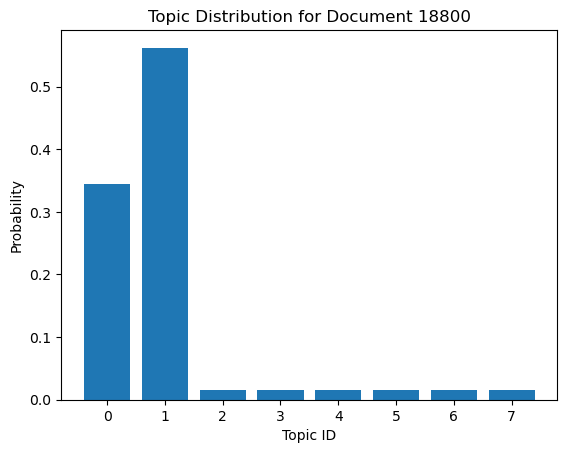

In [42]:
import matplotlib.pyplot as plt

# Choose a document index
doc_id = 18800

# Get the topic distribution for the document
doc_topics = model.get_document_topics(corpus[doc_id])

# Separate the topic IDs and their corresponding probabilities
topic_ids, probs = zip(*doc_topics)

# Plot
plt.bar(topic_ids, probs)
plt.xlabel('Topic ID')
plt.ylabel('Probability')
plt.title(f'Topic Distribution for Document {doc_id}')
plt.xticks(range(num_topics))
plt.show()

### Feature Extraction

In [44]:
from sklearn.feature_extraction.text import TfidfVectorizer

# df['lemmatized_review'] contains lists of lemmatized tokens
lemmatized_reviews = [' '.join(tokens) for tokens in df['lemmatized_review']]

tfidf = TfidfVectorizer(max_features=1000)
features = tfidf.fit_transform(lemmatized_reviews)



### Model Training and Evaluation

In [46]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

X_train, X_test, y_train, y_test = train_test_split(features, df['ratings'], test_size=0.2, random_state=42)

model = LogisticRegression()
model.fit(X_train, y_train)

# Predictions
predictions = model.predict(X_test)

/Users/sanilanair/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [47]:
# Evaluation
print(f"Accuracy: {accuracy_score(y_test, predictions)}")
print(classification_report(y_test, predictions))

Accuracy: 0.6588571428571428
              precision    recall  f1-score   support

           1       1.00      0.00      0.00       764
           2       0.00      0.00      0.00       187
           3       0.19      0.01      0.01       462
           4       0.17      0.01      0.01       963
           5       0.66      1.00      0.80      4624

    accuracy                           0.66      7000
   macro avg       0.40      0.20      0.16      7000
weighted avg       0.58      0.66      0.53      7000



/Users/sanilanair/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/sanilanair/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/sanilanair/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
